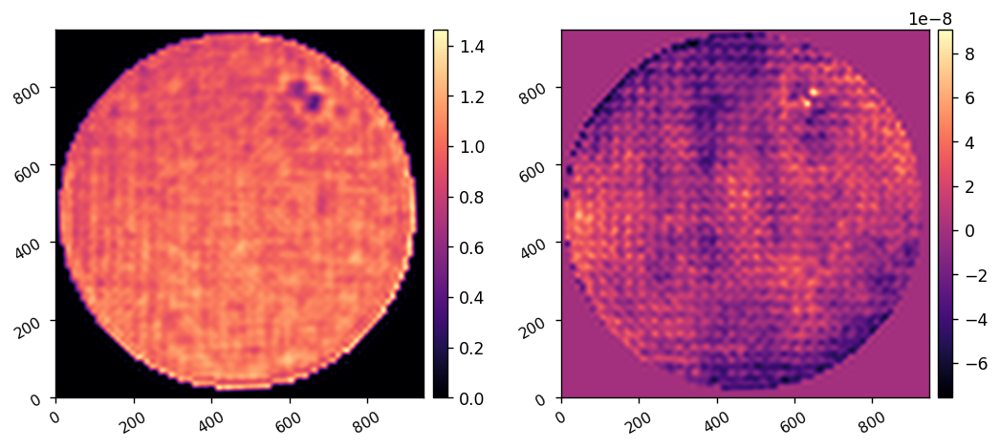

In [27]:
import numpy as np
import astropy.units as u
from astropy.io import fits
import copy
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Rectangle
from importlib import reload

from scipy.optimize import minimize
import skimage

import scoobpsf
import scoobpsf.scoobi as scoobi
import scoobpsf.ad_scoob as ad_scoob
import scoobpsf.ad_efc as ad_efc
import scoobpsf.utils as utils
from scoobpsf.math_module import xp, _scipy, ensure_np_array
from scoobpsf.imshows import imshow1, imshow2, imshow3

import purepyindi
from purepyindi import INDIClient
client0 = INDIClient('localhost', 7624)
client0.start()

import purepyindi2
from purepyindi2 import IndiClient
client = IndiClient()
client.connect()
client.get_properties()

wavelength_c = 633e-9
npix = 1000
nlyot = 946

wfe_amp = xp.array(fits.getdata('data/pr_est_amp.fits'))
wfe_opd = xp.array(fits.getdata('data/pr_est_opd.fits'))
WFE = wfe_amp * xp.exp(1j* 2*np.pi/wavelength_c * wfe_opd)
imshow2(wfe_amp, wfe_opd)


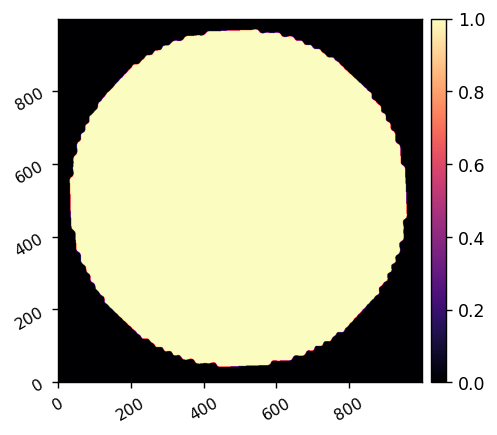

In [35]:
sub_mask = wfe_amp>0.3
sub_mask = utils.pad_or_crop(sub_mask,npix)
imshow1(sub_mask)

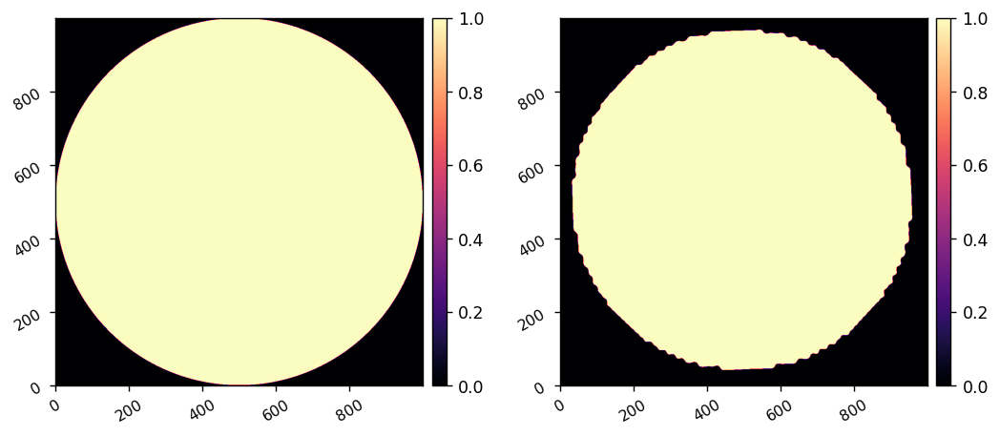

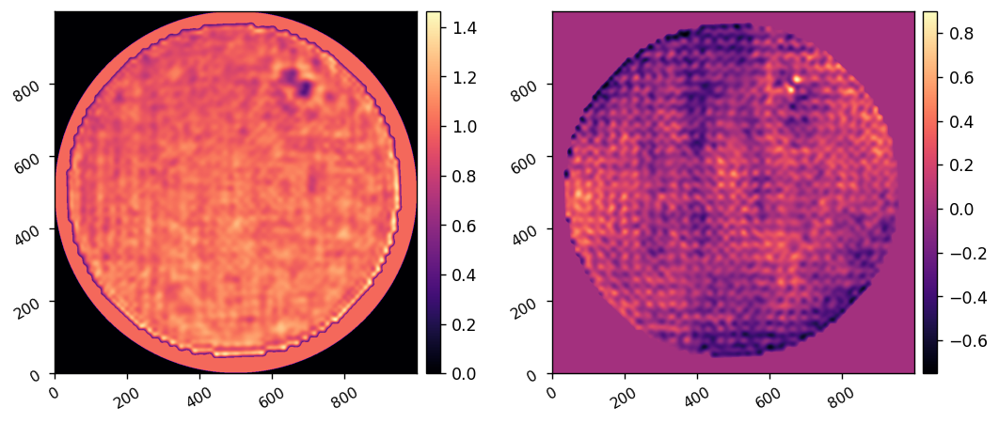

In [36]:
full_wfe = xp.zeros((npix,npix))
y,x = xp.indices((npix,npix)) - npix//2
r = xp.sqrt(x**2 + y**2)
full_mask = r<npix/2

sub_mask = wfe_amp>0.3
sub_mask = utils.pad_or_crop(sub_mask,npix)
imshow2(full_mask, sub_mask)

full_wfe = full_mask.astype(complex)
full_wfe[sub_mask] =  utils.pad_or_crop(WFE, npix)[sub_mask]
imshow2(xp.abs(full_wfe), xp.angle(full_wfe))

In [37]:
reload(scoobi)
xc, yc = (4263, 2920)
npsf = 256
scoobi.set_zwo_roi(xc, yc, npsf, client0)

In [75]:
reload(scoobi)
tbi = scoobi.SCOOBI(cam_channel='scicam', dm_channel='dm00disp05')
tbi.npsf = 150

# Do the normalization

In [47]:
scoobi.move_psf(-50, 0, client0)

In [49]:
reload(scoobi)
tbi.set_zwo_exp_time(0.00001, client0)

Set the ZWO exposure time to 3.20e-05s


In [50]:
reload(scoobi)
tbi.set_zwo_emgain(120, client0)

Set the ZWO gain setting to 120.0


In [51]:
reload(scoobi)
tbi.set_fib_atten(17, client)

Set the fiber attenuation to 17.0


INFO:utils:Got semaphore index 0.


50311.84


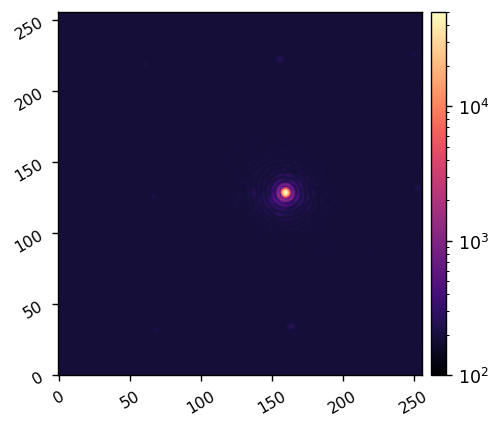

In [52]:
tbi.Nframes = 100
ref_psf = tbi.snap()
print(xp.max(ref_psf))
imshow1(ref_psf, lognorm=True, vmin=1e2)

In [76]:
reload(scoobi)

tbi.Imax_ref = copy.copy(xp.max(ref_psf))
tbi.texp_ref = 3.2e-5
tbi.att_ref = 17
tbi.gain_ref = 120
print(tbi.Imax_ref, tbi.texp_ref, tbi.att_ref, tbi.gain_ref  )

50311.84 3.2e-05 17 120


In [65]:
scoobi.move_psf(-2, 0, client0)

In [66]:
scoobi.move_psf(0, -5, client0)

In [86]:
tbi.set_fib_atten(0, client)

Set the fiber attenuation to 0.0


In [84]:
tbi.set_zwo_exp_time(0.002, client0)

Set the ZWO exposure time to 2.00e-03s


In [85]:
tbi.set_zwo_emgain(120, client0)

Set the ZWO gain setting to 120.0


In [77]:
reload(scoobi)
scoobi.move_block_in(client0)

In [79]:
reload(scoobi)
scoobi.move_block_out(client0)

INFO:utils:Got semaphore index 0.


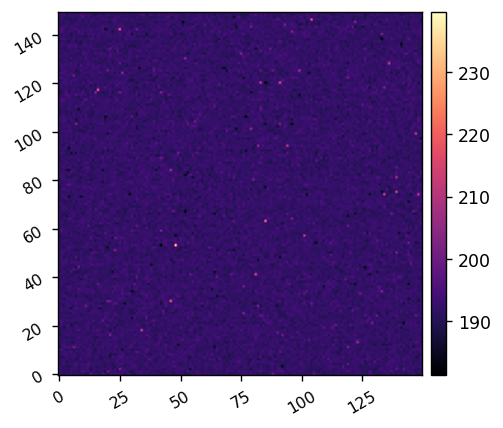

In [78]:
tbi.Nframes = 100

tbi.subtract_dark = False
tbi.return_ni = False
dark_frame = tbi.snap()
imshow1(dark_frame)

tbi.df = copy.copy(dark_frame)

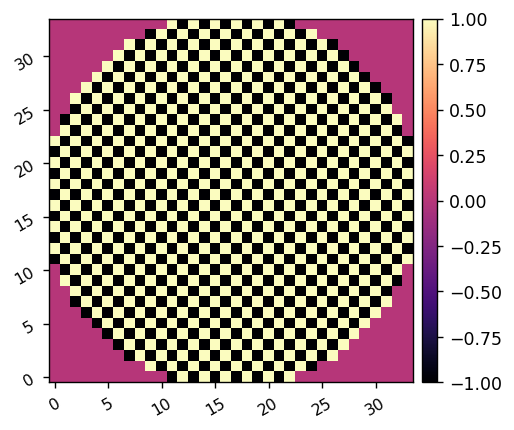

In [80]:
reload(scoobpsf.utils)
waffle_command = scoobpsf.utils.create_fourier_command(x_cpa=17, y_cpa=17) * xp.array(tbi.dm_mask)
imshow1(waffle_command)

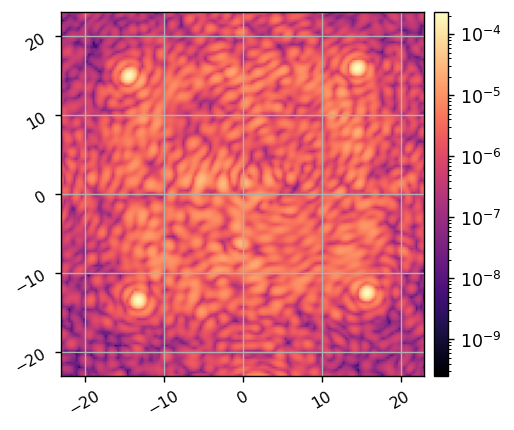

In [87]:
tbi.set_dm(15e-9 * waffle_command)
tbi.x_shift = 0
tbi.y_shift = 0

tbi.subtract_dark = True
tbi.return_ni = True
waffle_im = tbi.snap()
imshow1(waffle_im, lognorm=True, pxscl=tbi.psf_pixelscale_lamD, grid=True)

Centroids:
 [[ 31.45026461  30.69452126]
 [ 27.60024252 123.30778376]
 [121.78947549 126.44591854]
 [125.68452748  33.78189107]
 [ 31.45026461  30.69452126]]


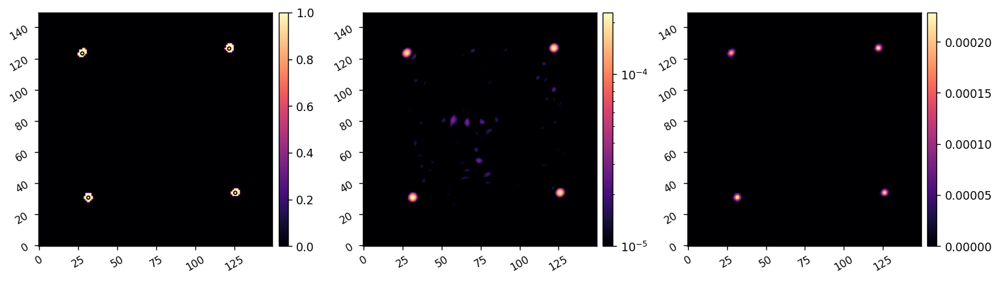

Angle:  87.8569594455506
Measured center in X:  76.61742051410788
Measured center in Y:  78.56762361014745
Required shift in X:  -2.0
Required shift in Y:  -4.0


In [90]:
reload(scoobpsf.utils)

xshift,yshift,angle = scoobpsf.utils.measure_center_and_angle(waffle_im, tbi.psf_pixelscale_lamD, im_thresh=3e-5, r_thresh=15)

-2.0 -4.0


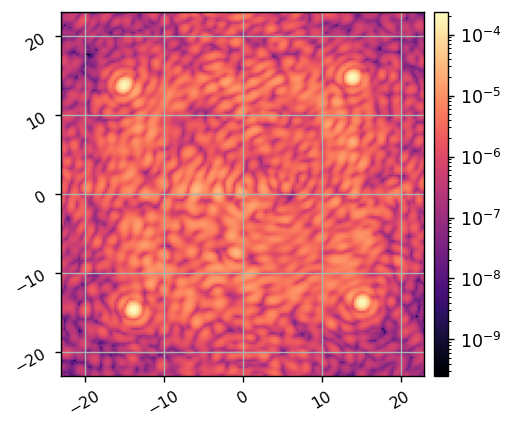

In [91]:
tbi.set_dm(15e-9 * waffle_command)
tbi.x_shift = xshift
tbi.y_shift = yshift
print(tbi.x_shift, tbi.y_shift)

tbi.subtract_dark = True
tbi.return_ni = True
new_waffle_im = tbi.snap()
imshow1(new_waffle_im, lognorm=True, pxscl=tbi.psf_pixelscale_lamD, grid=True)

Centroids:
 [[ 29.35410022  26.78245566]
 [ 25.62628749 119.35963815]
 [119.73822055 122.57317477]
 [123.63408628  29.82215051]
 [ 29.35410022  26.78245566]]


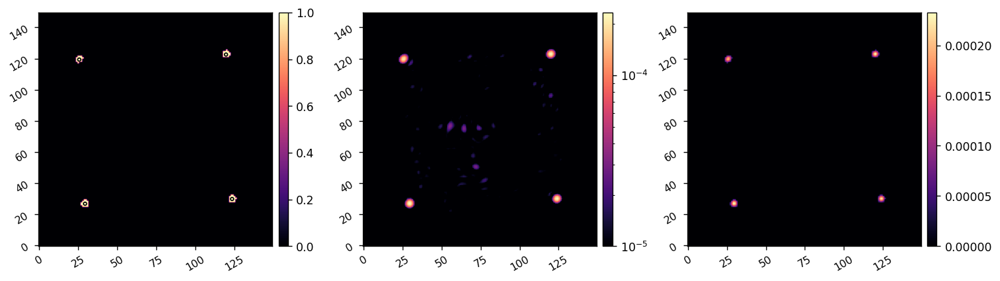

Angle:  87.87165143603892
Measured center in X:  74.54101373584794
Measured center in Y:  74.67236070232963
Required shift in X:  0.0
Required shift in Y:  0.0


In [92]:
xc,yc,angle = scoobpsf.utils.measure_center_and_angle(new_waffle_im, tbi.psf_pixelscale_lamD, im_thresh=5e-5, r_thresh=15)

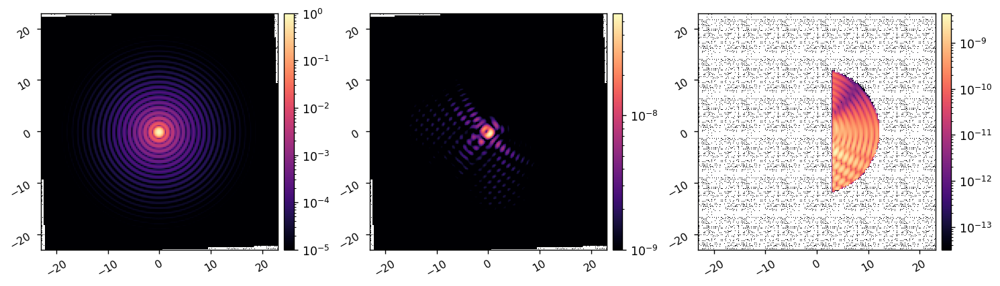

In [97]:
reload(ad_scoob)
m = ad_scoob.MODEL()
# m.WFE = WFE

m.npsf = 150
m.det_rotation = 178
m.psf_pixelscale_lamD = 0.307

m.create_control_mask()

acts = np.zeros(m.Nacts)

ref_psf = m.snap(acts, use_vortex=False)
m.Imax_ref = xp.max(ref_psf)
ref_coro_im = m.snap(acts)

imshow3(ref_psf/m.Imax_ref, ref_coro_im, ref_coro_im*m.control_mask,
        pxscl=m.psf_pixelscale_lamD, lognorm=True, vmin1=1e-5, vmin2=1e-9)


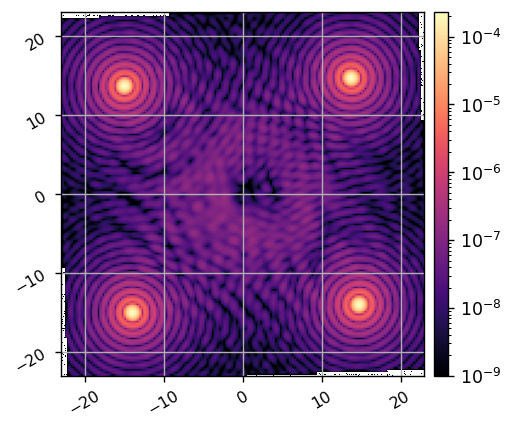

In [98]:
waffle_im_m = m.snap(15e-9 * waffle_command[m.dm_mask])
waffle_im_m *= xp.max(waffle_im)/xp.max(waffle_im_m)
imshow1(waffle_im_m, lognorm=True, pxscl=m.psf_pixelscale_lamD, grid=True, vmin=1e-9)

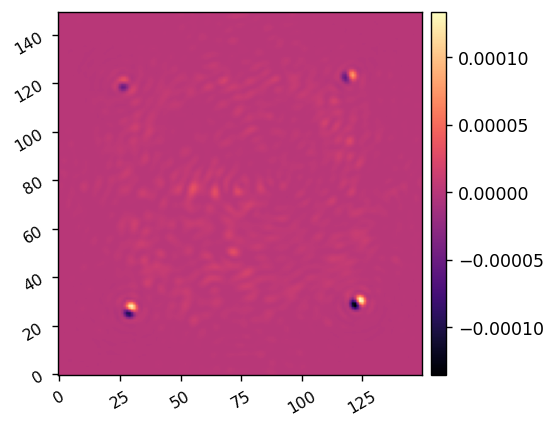

In [99]:

imshow1(new_waffle_im - waffle_im_m)

# Test PWP

3.0648933132153034e-06


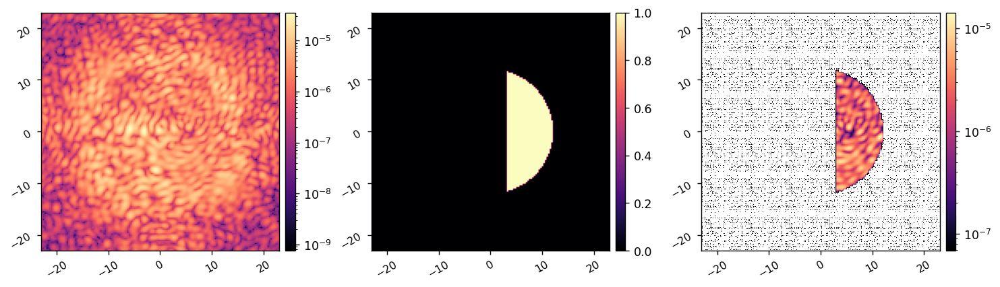

In [101]:
tbi.zero_dm()
tbi.Nframes = 10
tbi.subtract_dark = True
tbi.return_ni = True

ref_coro_im = tbi.snap()
print(xp.mean(ref_coro_im[control_mask]))
imshow3(ref_coro_im, control_mask, control_mask * ref_coro_im,
        lognorm1=True, lognorm3=True, pxscl=tbi.psf_pixelscale_lamD)

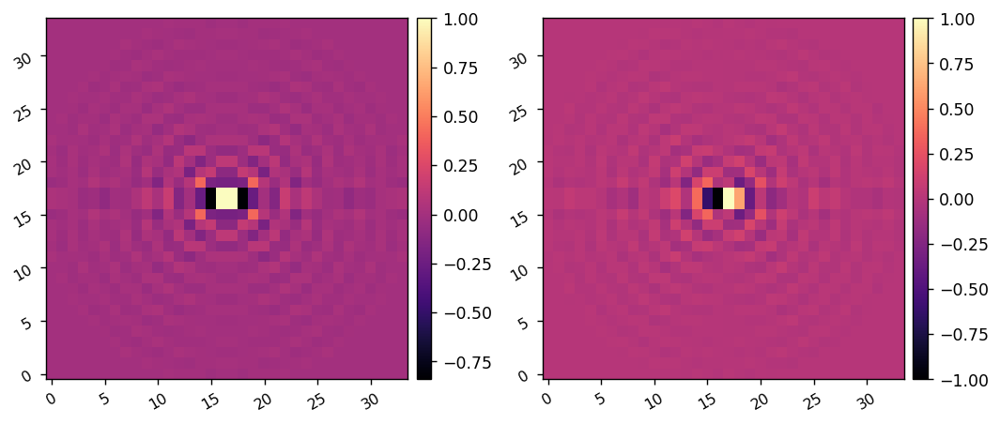

In [102]:
import lina 
reload(lina.utils)

probe_mask = lina.utils.create_annular_control_mask(m.npsf, m.psf_pixelscale_lamD, 
                                                    iwa=3, owa=12, edge=3, rotation=m.det_rotation-180, centered=True)
imshow1(probe_mask)
probe_modes = lina.utils.create_fourier_probes(m, 
                                               probe_mask,
                                               fourier_sampling=0.25, 
                                               use_weighting=True,
                                               nprobes=2, 
                                               )
imshow2(probe_modes[0], probe_modes[1])

In [111]:
tbi.set_zwo_emgain(120, client0)
tbi.set_zwo_exp_time(0.005, client0)

Set the ZWO gain setting to 120.0
Set the ZWO exposure time to 5.00e-03s


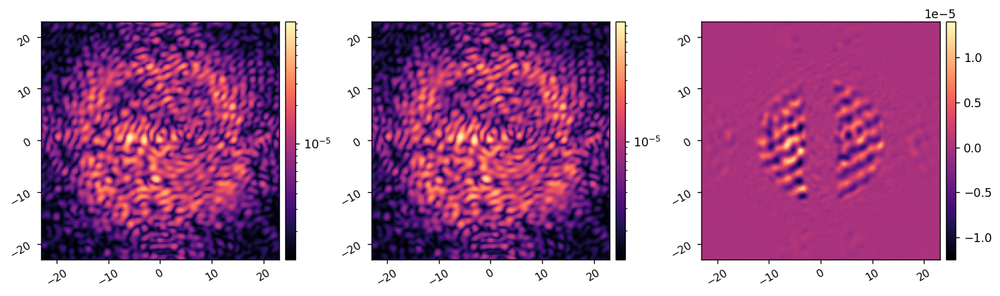

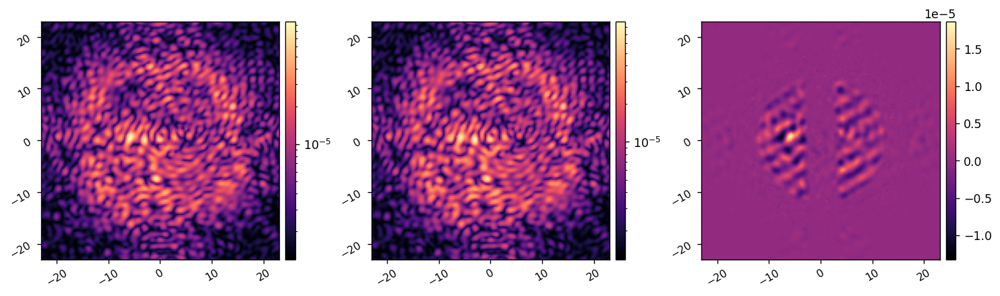

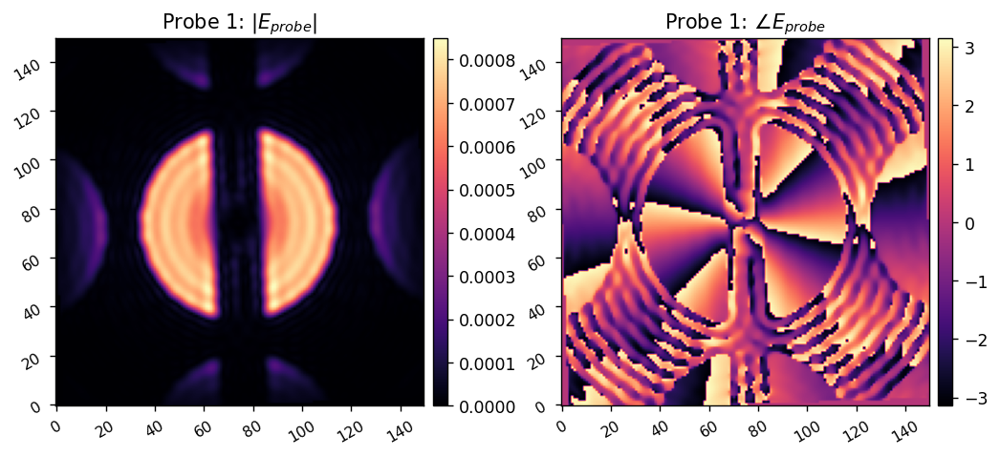

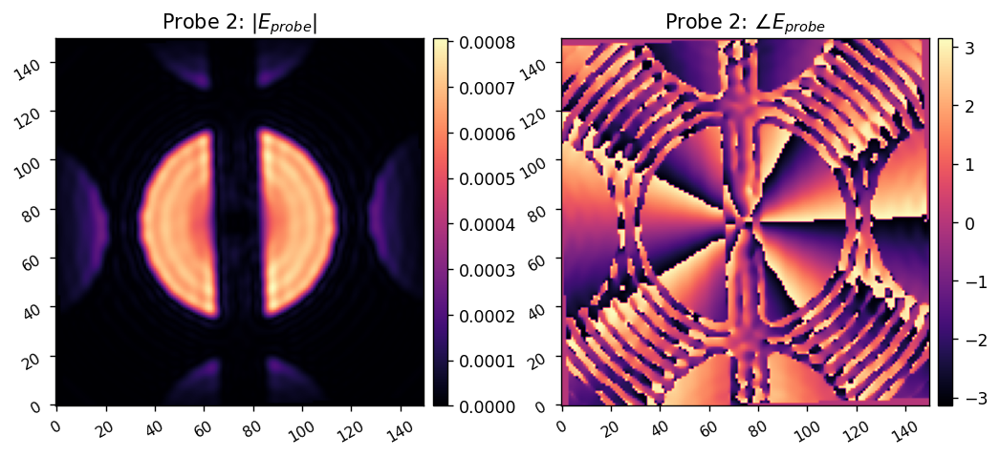

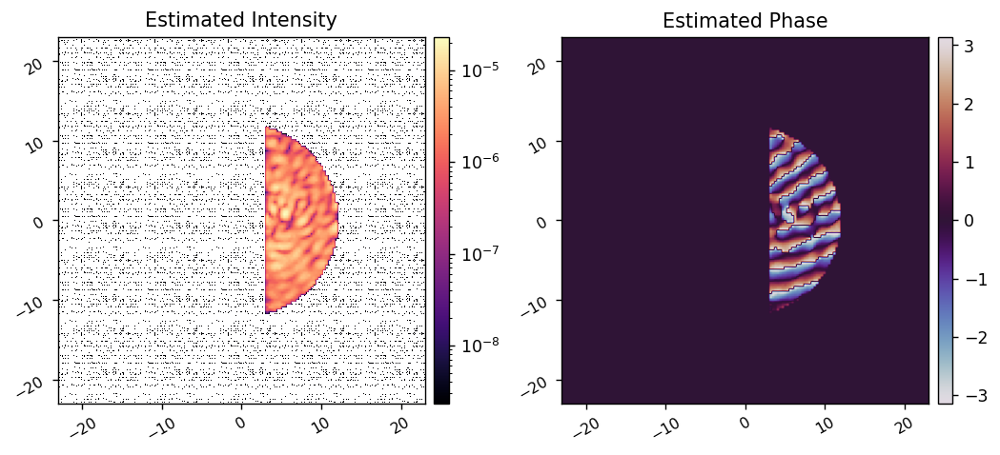

In [104]:
reload(ad_efc)

acts = xp.zeros(m.Nacts)
probe_amp = 5e-9

tbi.dm_delay = 0.01
tbi.subtract_dark = False

E_est = ad_efc.run_pwp(tbi, m, acts, 
                       control_mask, 
                       probe_modes, probe_amp, 
                       reg_cond=1e-3, 
                       plot=True,
                       plot_est=True,
                       )
I_est = xp.abs(E_est)**2
P_est = xp.angle(E_est)


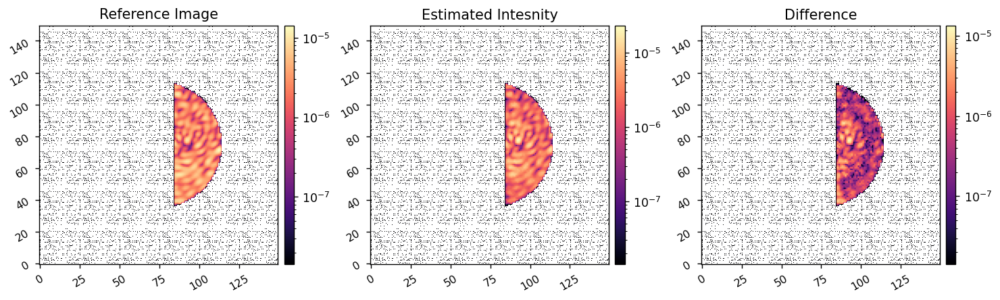

In [105]:
I = ref_coro_im*control_mask
I_diff = I - I_est
vmin = xp.max(I)/1e3
imshow3(I, I_est, xp.abs(I_diff), 
        'Reference Image', 'Estimated Intesnity', 'Difference',
        lognorm1=True, lognorm2=True, vmin1=vmin, vmin2=vmin, 
        lognorm3=True, vmin3=vmin,
        )

0.0053796202169418056 0.0 0.0053796202169418056 1.0
0.0


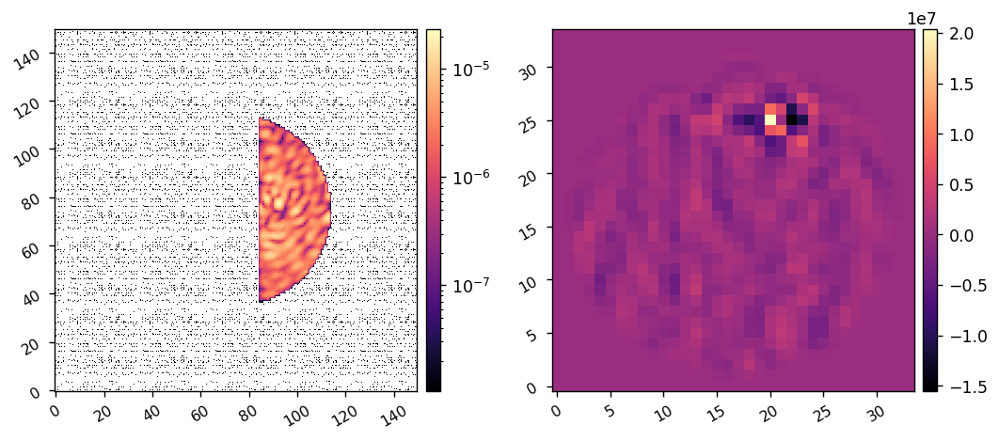

In [106]:
reload(ad_scoob)

acts = np.zeros(m.Nacts)
# acts = fits.getdata('data/ad_test_acts.fits')

E_ab = copy.copy(E_est)
r_cond = 1e-2

del_acts = np.zeros(m.Nacts)
J, dJ_dA = ad_scoob.val_and_grad(del_acts, m, acts, E_ab, r_cond, verbose=True)

dm_grad = ad_scoob.acts_to_command(dJ_dA, m.dm_mask)
print(dm_grad[25,21])
imshow2(xp.abs(E_ab)**2, dm_grad, lognorm1=True)

In [ ]:
# so the exit pupil looks like it is flipped vertically because we go through a 180degree rotation and then there is arfelection

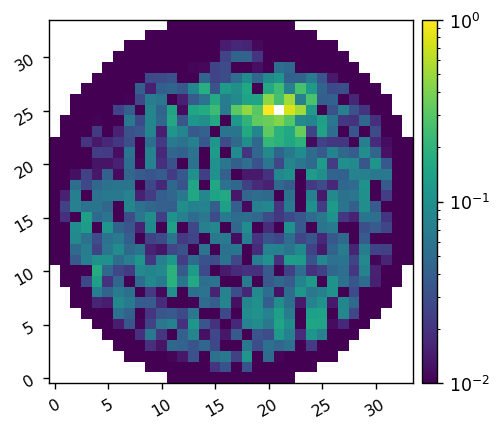

In [107]:
imshow1(xp.abs(dm_grad)/xp.max(xp.abs(dm_grad)), lognorm=True, vmin=1e-2, cmap='viridis')
# imshow1(xp.abs(dm_grad)/xp.max(xp.abs(dm_grad))>1e-3)

In [108]:

acts = np.zeros(m.Nacts)
# acts = fits.getdata('data/ad_test_acts.fits')

E_ab = copy.copy(E_est)
r_cond = 1e-2
bfgs_tol = 1e-3
bfgs_opts = {
    'disp':True,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

del_acts0 = np.zeros(m.Nacts)
res = minimize(ad_scoob.val_and_grad, 
                jac=True, 
                x0=del_acts0,
                args=(m, acts, E_ab, r_cond, True), 
                method='L-BFGS-B',
                tol=bfgs_tol,
                options=bfgs_opts,
                )

0.0053796202169418056 0.0 0.0053796202169418056 1.0


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          951     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  2.03387D+07
0.007621907389512772 24957011547.609238 0.0053796202169418056 4639177217198.497
2.8908555333457286 0.09033291127305622 0.0053796202169418056 554.1633655160744
0.0843849451417472 0.0007048174872597359 0.0053796202169418056 15.8170575612452
0.0015331973525234011 2.5867864730777867e-05 0.0053796202169418056 0.28980953197110126

At iterate    1    f=  2.89810D-01    |proj g|=  5.24879D+06
0.0008004587296406309 2.839247361392744e-05 0.0053796202169418056 0.15407243817031785

At iterate    2    f=  1.54072D-01    |proj g|=  2.52277D+06
0.000577350264952441 3.434698869861834e-05 0.0053796202169418056 0.11370640100664867

At iterate    3    f=  1.13706D-01    |proj g|=  9.79959D+05
0.0004506576180532987 4.263813715697717e-05 0.0053796202169418056 0.09169713387141361

A

0.0


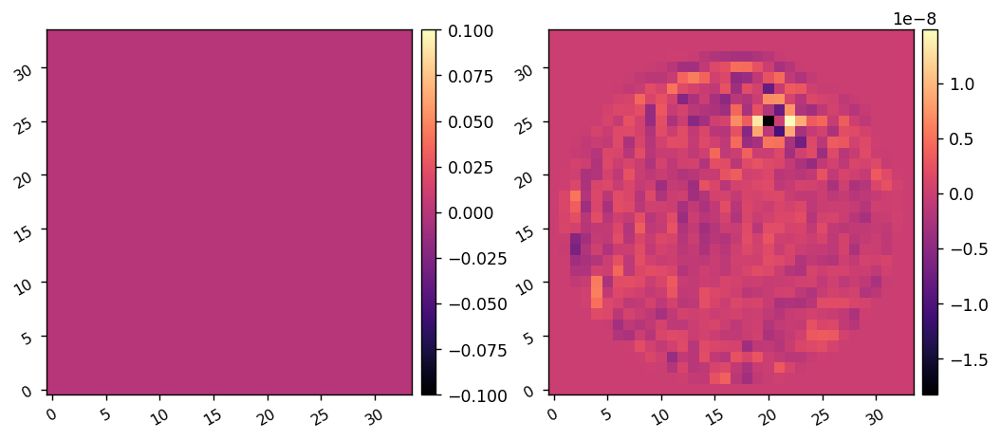

In [109]:
old_command = ad_scoob.acts_to_command(acts, m.dm_mask)
del_command = ad_scoob.acts_to_command(res.x, m.dm_mask)
print(del_command[25,21])
imshow2(old_command, del_command)


In [115]:
reload(scoobi)
scoobi.move_block_in(client0)

In [117]:
reload(scoobi)
scoobi.move_block_out(client0)

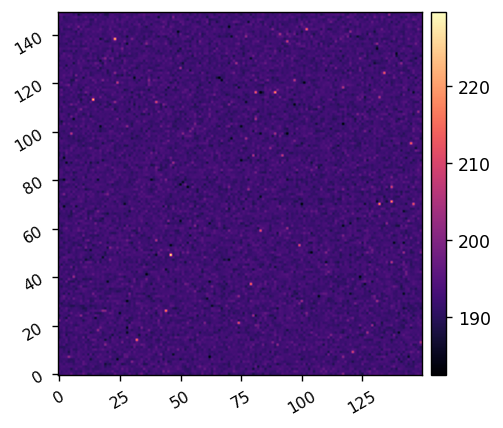

In [116]:
tbi.Nframes = 100

tbi.subtract_dark = False
tbi.return_ni = False
dark_frame = tbi.snap()
imshow1(dark_frame)

tbi.df = copy.copy(dark_frame)

3.1247029979925207e-06 1.3853065451623885e-06


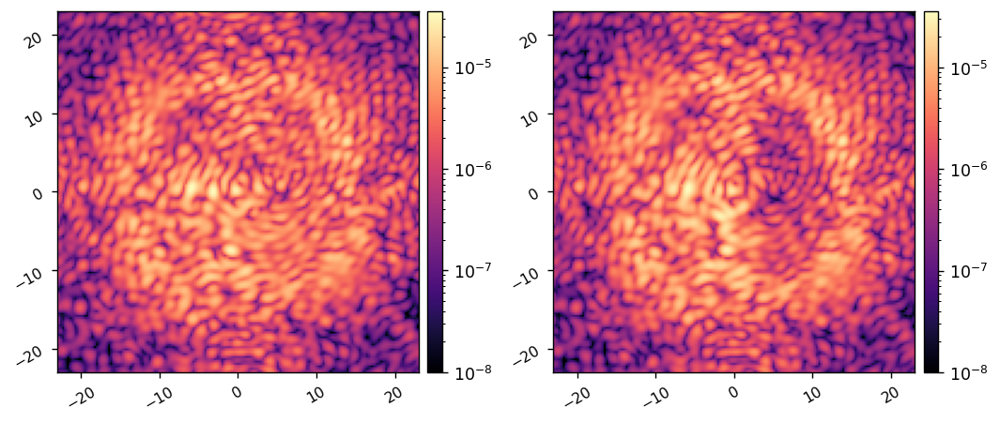

In [118]:
tbi.return_ni = True
tbi.subtract_dark = True

tbi.set_dm(old_command)
old_im = tbi.snap()
tbi.add_dm(del_command)
new_im = tbi.snap()

print(xp.mean(old_im[m.control_mask]), xp.mean(new_im[m.control_mask]))
imshow2(old_im, new_im, lognorm=True, pxscl=tbi.psf_pixelscale_lamD, vmin1=1e-8, vmin2=1e-8)

3.0883744669869614e-06


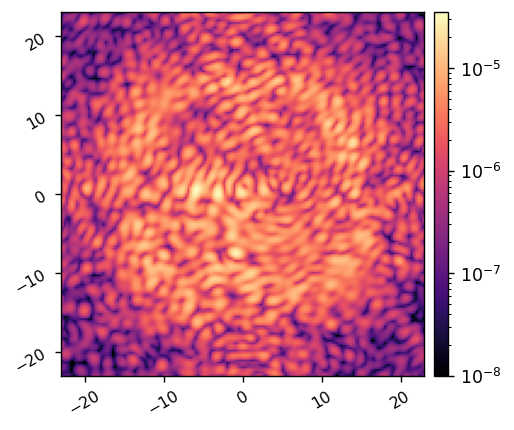

In [127]:
tbi.zero_dm()

tbi.return_ni = True
tbi.subtract_dark = True

coro_im = tbi.snap()

print(xp.mean(coro_im[m.control_mask]))
imshow1(coro_im, lognorm=True, pxscl=tbi.psf_pixelscale_lamD, vmin=1e-8)

In [119]:
tbi.zero_dm()

all_ims = []
all_efs = []
all_commands = []

Running estimation algoirthm ...


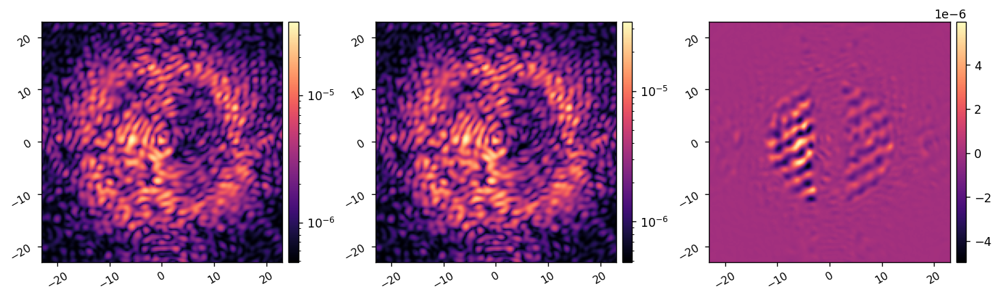

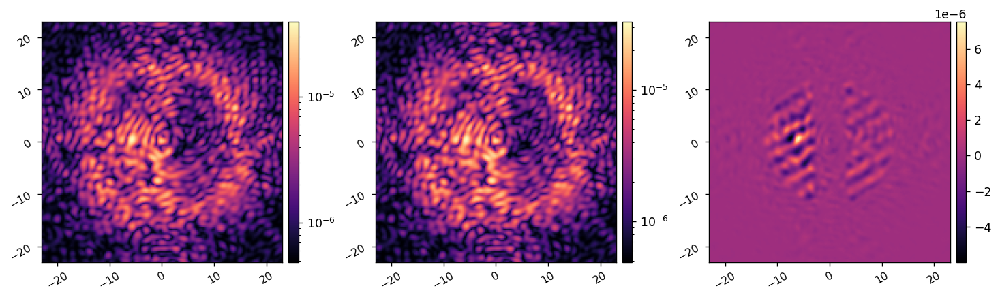

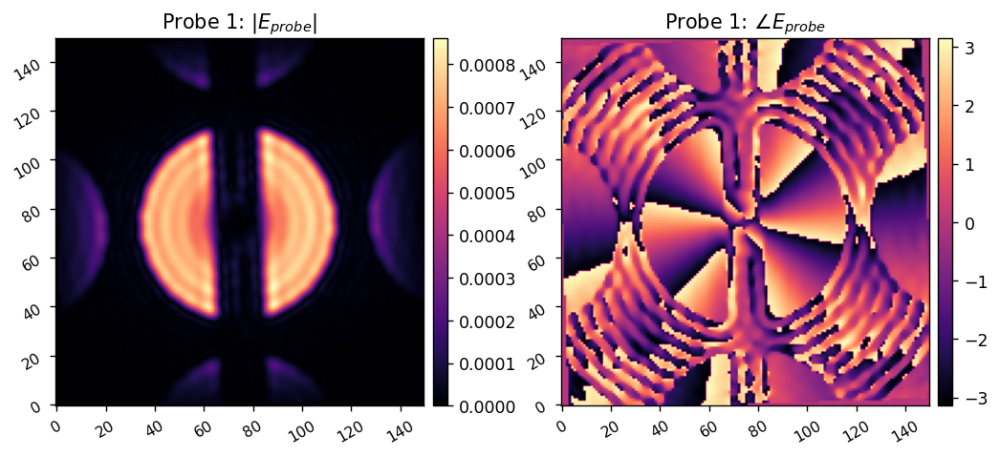

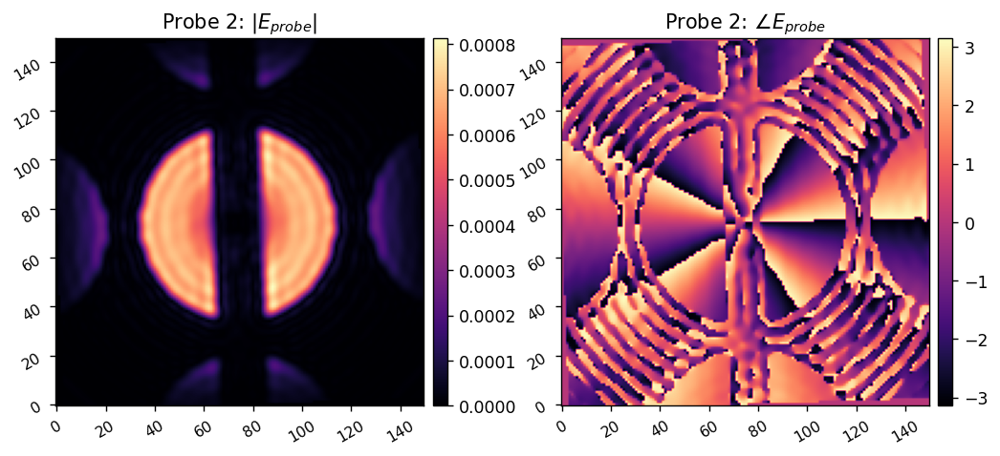

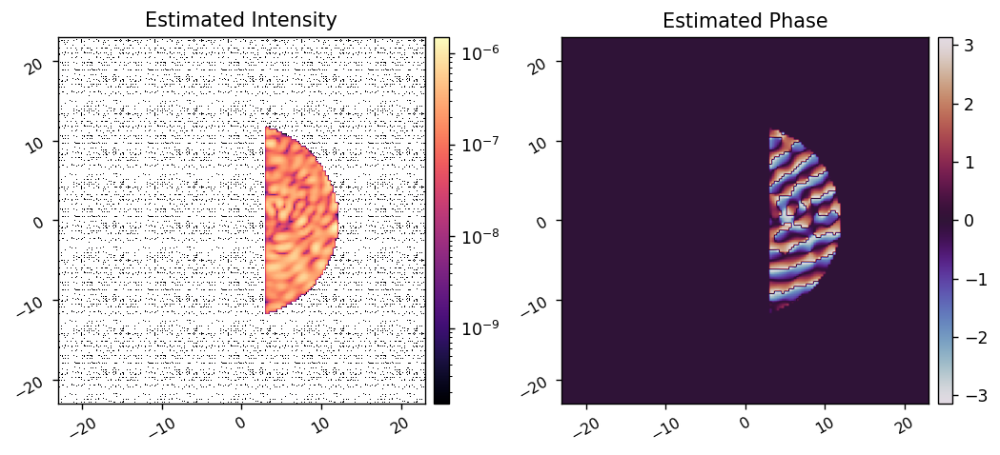

Computing EFC command with L-BFGS


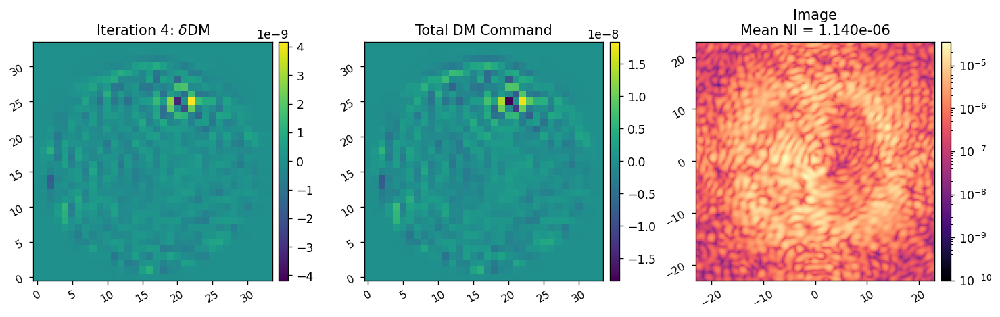

Running estimation algoirthm ...


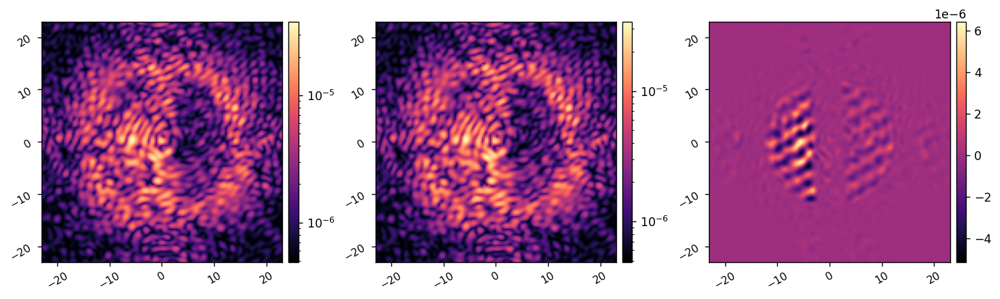

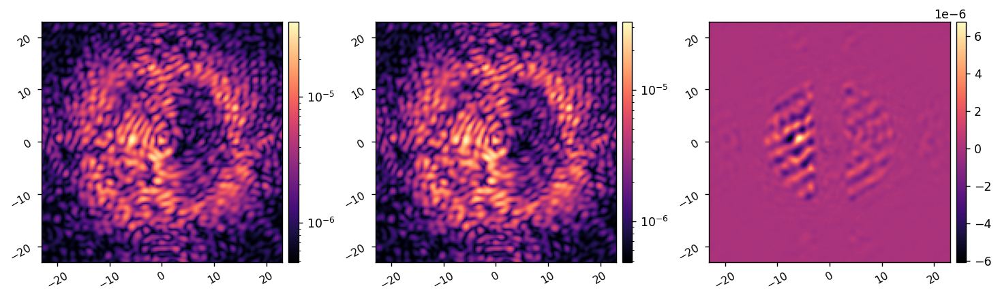

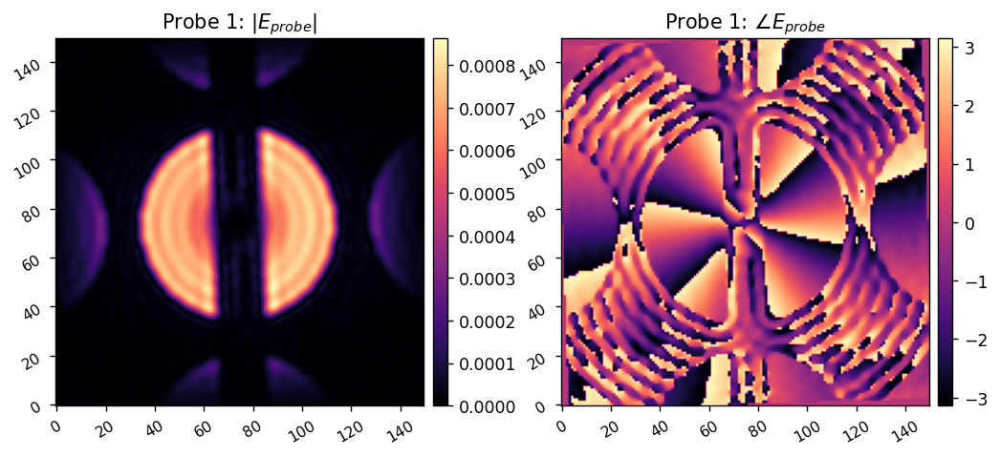

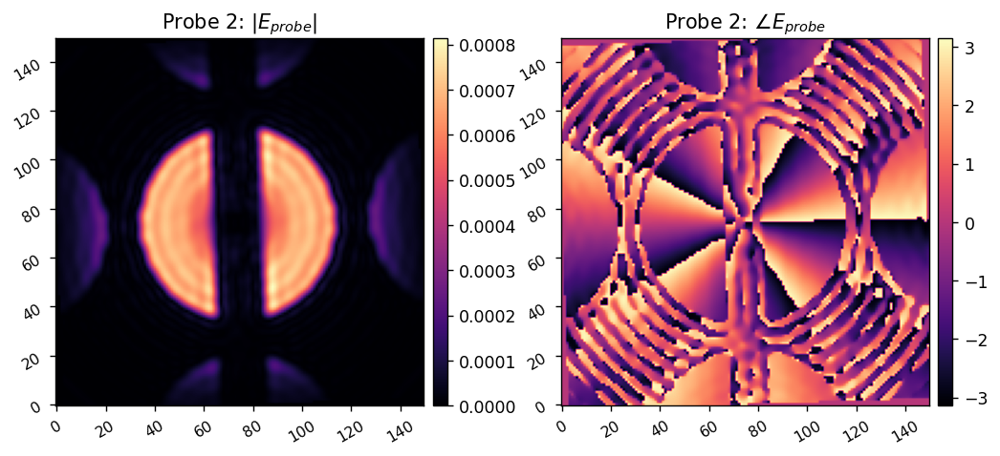

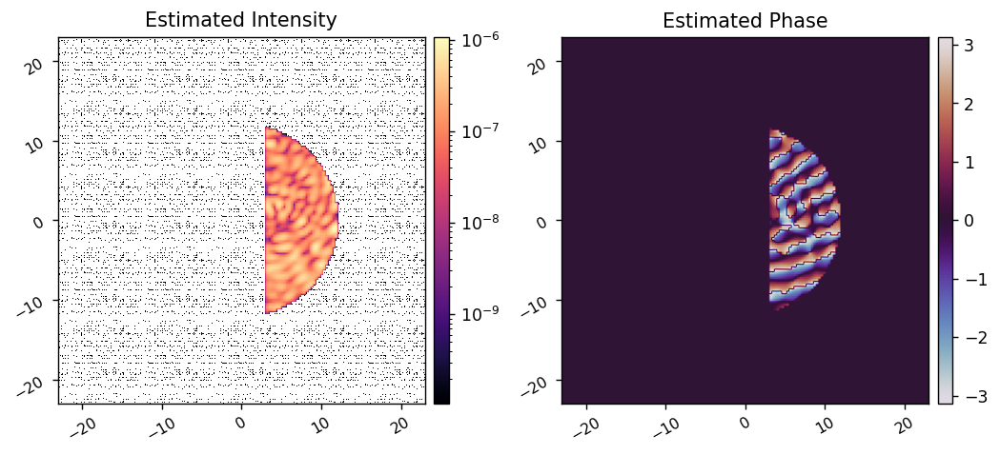

Computing EFC command with L-BFGS


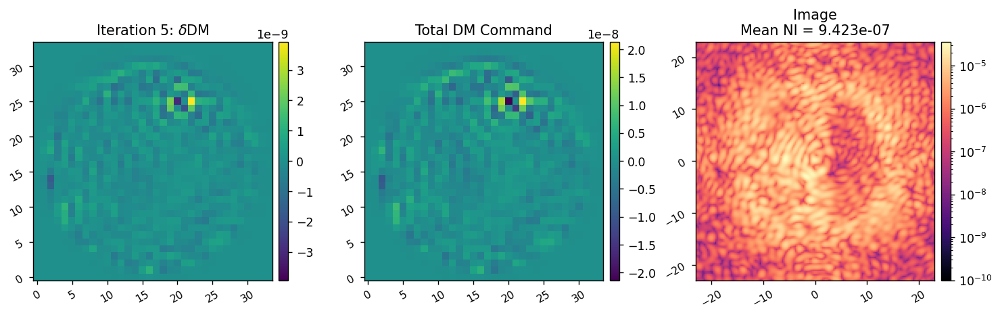

Running estimation algoirthm ...


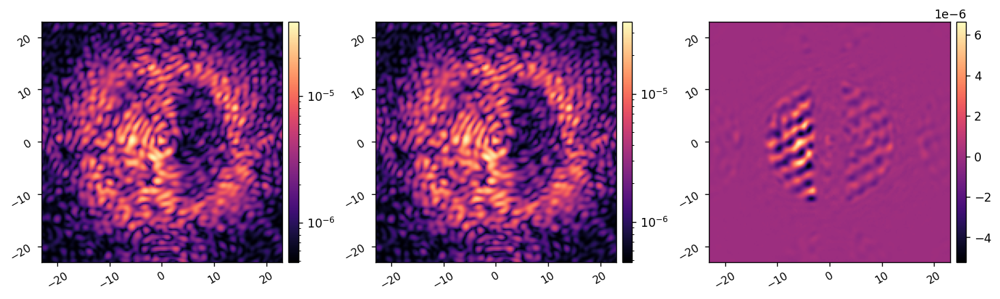

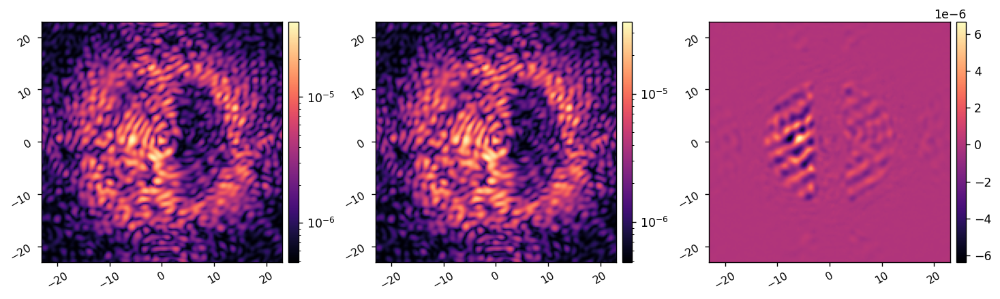

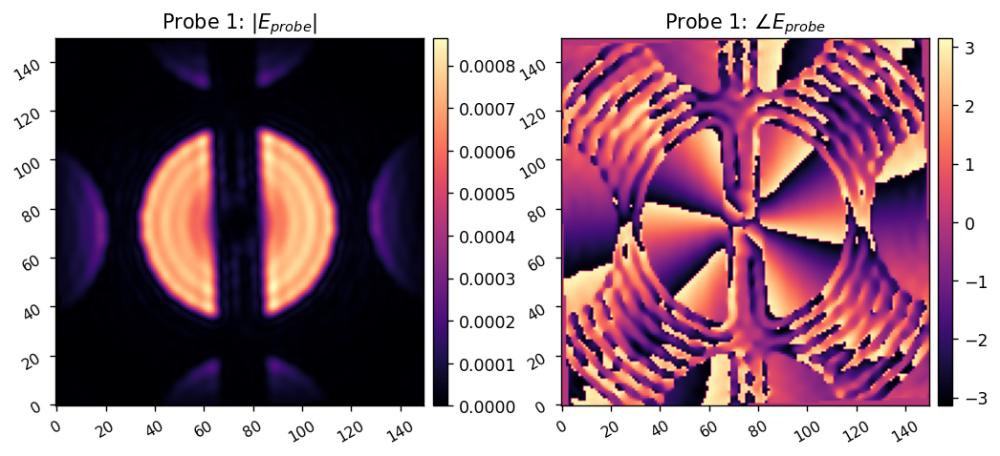

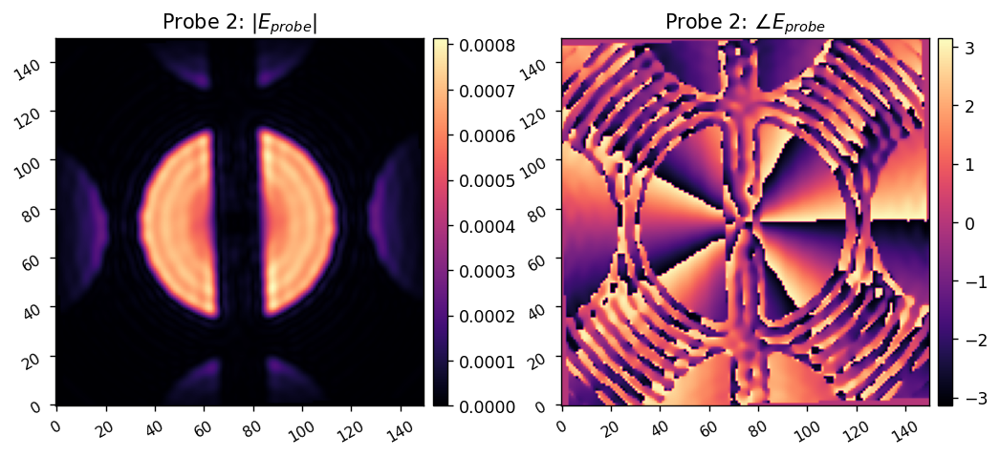

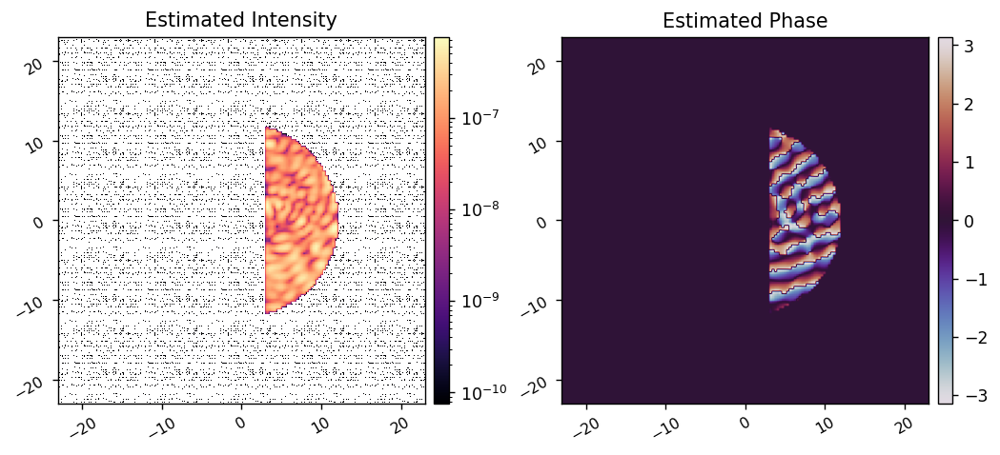

Computing EFC command with L-BFGS


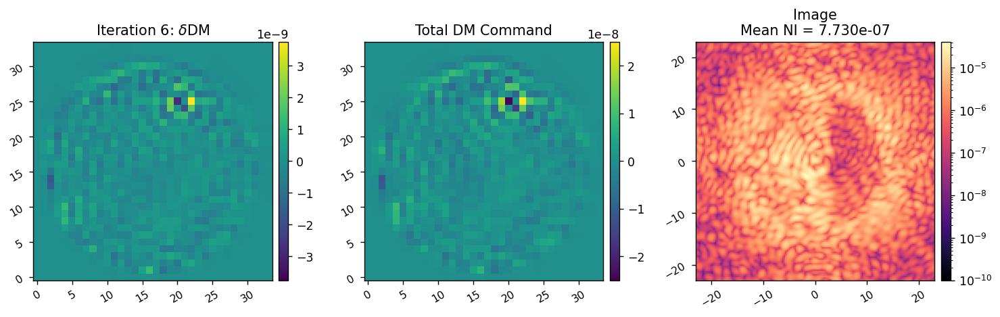

In [126]:
reload(ad_scoob)
reload(ad_efc)

r_cond = 1e-2
r_cond = 1e-3
# r_cond = 1e-4
# r_cond = 1e-5
r_cond = 1e-6

bfgs_tol = 1e-2
bfgs_tol = 1e-3
# bfgs_tol = 1e-4
# bfgs_tol = 1e-5

bfgs_opts = {
    'disp':False,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

est_fun = adefc.run_pwp
est_params = {
    # tbi, m, acts, 
    'control_mask':control_mask, 
    'probes': xp.array(probe_modes), 
    'probe_amp':5e-9, 
    # 'reg_cond':1e-2, 
    'reg_cond':1e-3, 
    # 'reg_cond':1e-4, 
    'plot':True, 
    'plot_est':True,
}

all_ims, all_efs, all_commands = ad_efc.run(tbi, m, 
                                            ad_scoob.val_and_grad,
                                            control_mask,
                                            est_fun, est_params, 
                                            Nitr=3, 
                                            reg_cond=r_cond,
                                            bfgs_tol=bfgs_tol,
                                            bfgs_opts=bfgs_opts,
                                            gain=0.8,
                                            all_ims=all_ims,
                                            all_efs=all_efs,
                                            all_commands=all_commands,
                                            )

1.4311592181099314e-06


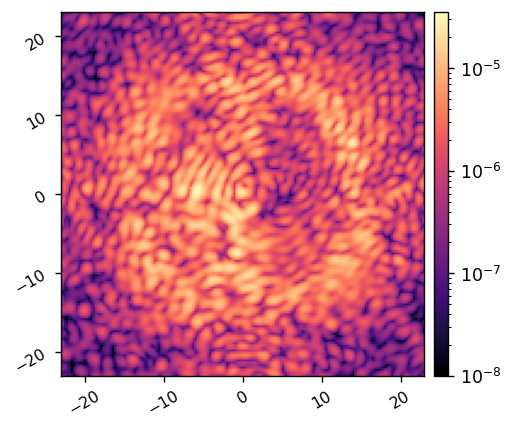

In [125]:
tbi.set_dm(all_commands[-1])

tbi.return_ni = True
tbi.subtract_dark = True

coro_im = tbi.snap()

print(xp.mean(coro_im[m.control_mask]))
imshow1(coro_im, lognorm=True, pxscl=tbi.psf_pixelscale_lamD, vmin=1e-8)